In [1]:
import pandas as pd
import numpy as np
from scipy import stats
from mlxtend.preprocessing import minmax_scaling
import seaborn as sns
import missingno
import matplotlib.pyplot as plt
import plotly as px
import plotly.express as pe
import chart_studio as py
import plotly.graph_objs as gobj
from plotly.offline import init_notebook_mode,plot,iplot,offline
init_notebook_mode(connected=True)
from plotly.graph_objs import *
%matplotlib inline


In [2]:
# Reading the data
commodities_df = pd.read_csv("commodity_trade_statistics_data.csv", delimiter = ",", low_memory=False)

commodities_df.country_or_area.replace({'China, Hong Kong SAR':'China'},inplace=True)
commodities_df.sample(5)


,country_or_area,year,comm_code,commodity,flow,trade_usd,weight_kg,quantity_name,quantity,category
6096542,Guinea,2015,711290,"Waste/scrap, precious metals except pure gold/...",Import,12647,5602.0,Weight in kilograms,5602.0,71_pearls_precious_stones_metals_coins_etc
2989960,Norway,1998,340600,"Candles, tapers and the like",Export,4437042,2120570.0,Weight in kilograms,2120570.0,34_soaps_lubricants_waxes_candles_modelling_pa...
5202186,Argentina,1998,611211,"Track suits, of cotton, knit",Import,267577,20508.0,Weight in kilograms,20508.0,61_articles_of_apparel_accessories_knit_or_cro...
1725675,Kazakhstan,2003,210120,"Tea and mate extracts, essences and concentrates",Import,329400,833106.0,Weight in kilograms,833106.0,21_miscellaneous_edible_preparations
3949897,Mexico,2012,470429,"Chem wood pulp, sulphite, non-coniferous, blea...",Export,351,180.0,Weight in kilograms,180.0,47_pulp_of_wood_fibrous_cellulosic_material_wa...


# Data Preparation

In [3]:
# Shape of the DataFrame
commodities_df.shape

(8225871, 10)

In [4]:
# Information about the DataFrame
commodities_df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8225871 entries, 0 to 8225870
Data columns (total 10 columns):
 #   Column           Non-Null Count    Dtype  
---  ------           --------------    -----  
 0   country_or_area  8225871 non-null  object 
 1   year             8225871 non-null  int64  
 2   comm_code        8225871 non-null  object 
 3   commodity        8225871 non-null  object 
 4   flow             8225871 non-null  object 
 5   trade_usd        8225871 non-null  int64  
 6   weight_kg        8097396 non-null  float64
 7   quantity_name    8225871 non-null  object 
 8   quantity         7921014 non-null  float64
 9   category         8225871 non-null  object 
dtypes: float64(2), int64(2), object(6)
memory usage: 627.6+ MB


In [5]:
# Check for missing values
commodities_df.count()

country_or_area    8225871
year               8225871
comm_code          8225871
commodity          8225871
flow               8225871
trade_usd          8225871
weight_kg          8097396
quantity_name      8225871
quantity           7921014
category           8225871
dtype: int64

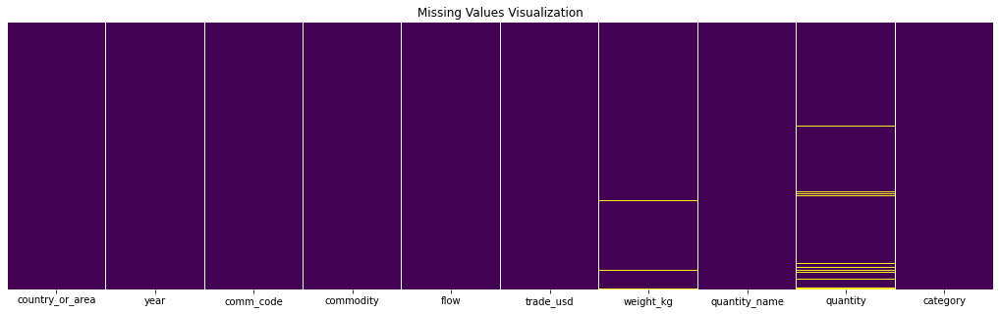

In [6]:
f,ax=plt.subplots(figsize=(18,5))
sns.heatmap(commodities_df.isnull(),yticklabels=False,cbar=False,cmap='viridis',ax=ax)
ax.set_title('Missing Values Visualization')
plt.show()

I can see that there are some missing and some null values in 'weight_kg' and 'quantity'

In [7]:
# Check for null values
commodities_df.isnull().sum()


country_or_area         0
year                    0
comm_code               0
commodity               0
flow                    0
trade_usd               0
weight_kg          128475
quantity_name           0
quantity           304857
category                0
dtype: int64

The 'quantity_name' column will not be required in my analysis so I will drop it.

In [8]:
commodities_df = commodities_df.drop(['quantity_name'], axis=1)
commodities_df.head()

,country_or_area,year,comm_code,commodity,flow,trade_usd,weight_kg,quantity,category
0,Afghanistan,2016,010410,"Sheep, live",Export,6088,2339.0,51.0,01_live_animals
1,Afghanistan,2016,010420,"Goats, live",Export,3958,984.0,53.0,01_live_animals
2,Afghanistan,2008,010210,"Bovine animals, live pure-bred breeding",Import,1026804,272.0,3769.0,01_live_animals
3,Albania,2016,010290,"Bovine animals, live, except pure-bred breeding",Import,2414533,1114023.0,6853.0,01_live_animals
4,Albania,2016,010392,"Swine, live except pure-bred breeding > 50 kg",Import,14265937,9484953.0,96040.0,01_live_animals


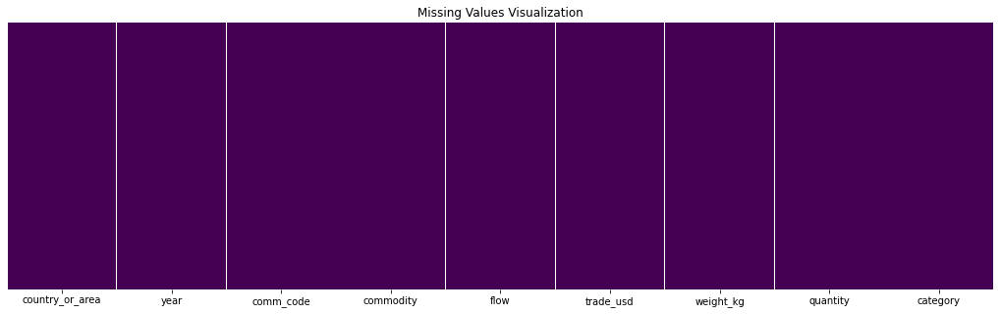

In [9]:
# Removing rows with null or missing values
commodities_df = commodities_df.dropna(how='any').reset_index(drop=True) 

f,ax=plt.subplots(figsize=(18,5))
sns.heatmap(commodities_df.isnull(),yticklabels=False,cbar=False,cmap='viridis',ax=ax)
ax.set_title('Missing Values Visualization')
plt.show()

In [10]:
# How many commodities are in the dataset ?
commodities_df['commodity'].nunique()

5031

In [11]:
# How many countries are in the dataset ?
commodities_df['country_or_area'].nunique()

206

In [12]:
# Data Summary
commodities_df.describe()


,year,trade_usd,weight_kg,quantity
count,7.876117e+06,7.876117e+06,7.876117e+06,7.876117e+06
mean,2.004599e+03,2.256751e+07,3.641745e+07,2.672027e+08
std,7.074780e+00,9.031957e+08,2.512519e+09,3.749842e+11
min,1.988000e+03,1.000000e+00,0.000000e+00,0.000000e+00
25%,1.999000e+03,1.138100e+04,1.139000e+03,1.082000e+03
50%,2.005000e+03,1.565570e+05,2.818900e+04,2.738100e+04
75%,2.011000e+03,1.906114e+06,4.669000e+05,4.648800e+05
max,2.016000e+03,5.241660e+11,1.860133e+12,1.026357e+15


In [13]:
# Trade_usd mean and median

print("\n Trade_usd average: " + str(commodities_df['trade_usd'].mean()))

print("\n Trade_usd median: " , str(commodities_df.trade_usd.median()))


 Trade_usd average: 22567507.178105276

 Trade_usd median:  156557.0


In [14]:
# Check the categories
commodities_df['category'].unique()

array(['01_live_animals', '02_meat_and_edible_meat_offal',
       '03_fish_crustaceans_molluscs_aquatic_invertebrates_ne',
       '04_dairy_products_eggs_honey_edible_animal_product_nes',
       '05_products_of_animal_origin_nes',
       '06_live_trees_plants_bulbs_roots_cut_flowers_etc',
       '07_edible_vegetables_and_certain_roots_and_tubers',
       '08_edible_fruit_nuts_peel_of_citrus_fruit_melons',
       '09_coffee_tea_mate_and_spices', '10_cereals',
       '11_milling_products_malt_starches_inulin_wheat_glute',
       '12_oil_seed_oleagic_fruits_grain_seed_fruit_etc_ne',
       '13_lac_gums_resins_vegetable_saps_and_extracts_nes',
       '14_vegetable_plaiting_materials_vegetable_products_nes',
       '15_animal_vegetable_fats_and_oils_cleavage_products_et',
       '16_meat_fish_and_seafood_food_preparations_nes',
       '17_sugars_and_sugar_confectionery',
       '18_cocoa_and_cocoa_preparations',
       '19_cereal_flour_starch_milk_preparations_and_products',
       '20_vege

In [15]:
# Check the commodities
commodities_df['commodity'].unique()

array(['Sheep, live', 'Goats, live',
       'Bovine animals, live pure-bred breeding', ...,
       'Original sculptures and statuary, in any material',
       'Commodities not specified according to kind', 'ALL COMMODITIES'],
      dtype=object)

In [16]:
# List all African countries

african_countries = commodities_df[commodities_df['country_or_area'].isin(['Burundi','Comoros','Djibouti','Eritrea','Ethiopia','Kenya','Madagascar','Malawi','Mauritius','Mayotte','Mozambique','Rwanda',
'Réunion','Seychelles','Somalia','Tanzania','Uganda','Zambia','Zimbabwe','Angola','Cameroon','Central African Republic','Chad','Congo','Equatorial Guinea','Gabon','São Tomé and Príncipe','Algeria','Egypt',
'Libya','Morocco','Sudan','Tunisia','Western Sahara','Botswana','Lesotho','Namibia','South Africa',
'Swaziland','Benin','Burkina Faso','Cape Verde','Côte d’Ivoire','Gambia','Ghana','Guinea','Guinea-Bissau',
'Liberia','Mali','Mauritania','Niger','Nigeria','Saint Helena','Senegal','Sierra Leone','Togo'])]

african_countries.sample(10)

,country_or_area,year,comm_code,commodity,flow,trade_usd,weight_kg,quantity,category
4651324,Egypt,2001,560500,Metallised yarn,Import,747290,177818.0,177818.0,56_wadding_felt_nonwovens_yarns_twine_cordage_etc
4284442,Burkina Faso,2005,520419,"Cotton sewing thread, <85% cotton, not retail",Import,198,592.0,592.0,52_cotton
6505772,Sierra Leone,2016,790500,"Zinc plates, sheets, strip and foil",Import,16297,13465.0,13465.0,79_zinc_and_articles_thereof
2642005,South Africa,2009,310530,"Diammonium phosphate, in packs >10 kg",Import,9785411,14559480.0,14559480.0,31_fertilizers
7181493,Benin,2005,880400,"Parachutes, parts and accessories thereof",Import,843,2.0,2.0,88_aircraft_spacecraft_and_parts_thereof
21679,Kenya,2002,010111,"Horses, live pure-bred breeding",Import,3615,9.0,9.0,01_live_animals
1424219,Madagascar,1991,180100,"Cocoa beans, whole or broken, raw or roasted",Export,3971947,4272629.0,4272629.0,18_cocoa_and_cocoa_preparations
1914534,South Africa,2014,230990,Animal feed preparations nes,Export,98773854,163250797.0,163250797.0,23_residues_wastes_of_food_industry_animal_fodder
6627418,South Africa,2016,810310,"Tantalum unwrought, bars, rods simply sintered...",Import,2642,8.0,8.0,81_other_base_metals_cermets_articles_thereof
4767211,Madagascar,2005,570241,"Carpets of wool or hair, woven pile, made up, nes",Export,37,45.0,1.0,57_carpets_and_other_textile_floor_coverings


In [17]:
# Check countries occurrences
african_countries.country_or_area.value_counts()

Algeria          121137
Botswana          88060
Egypt             64953
Cameroon          58668
Burkina Faso      52023
Benin             41918
Ethiopia          41346
Burundi           39483
Ghana             33209
Mauritius         31120
Morocco           29701
Madagascar        28992
Angola            28444
Kenya             28080
Gabon             22586
Namibia           21798
Gambia            20713
Malawi            19725
South Africa      18637
Congo             17883
Comoros           17579
Tunisia           16072
Niger             13385
Guinea            12575
Mozambique        11814
Nigeria           11513
Uganda            11001
Senegal           10950
Mali              10717
Zambia             8754
Lesotho            8699
Rwanda             8480
Seychelles         8470
Zimbabwe           7406
Swaziland          7207
Mauritania         5708
Togo               5630
Mayotte            5614
Libya              2155
Eritrea            1730
Chad               1389
Guinea-Bissau   

# - Data Exploration

# 1 - How African countries perform compared to the rest of the world?

In [18]:
Africa_trade = african_countries[african_countries.comm_code!= 'TOTAL'].groupby(['year'],as_index=False)['trade_usd'].agg('sum')
World_trade = commodities_df[commodities_df.comm_code!= 'TOTAL'].groupby(['year'],as_index=False)['trade_usd'].agg('sum')

trace0 = {
    'x': Africa_trade.year,
    'y': Africa_trade.trade_usd,
    'name': "Africa",
    'type': 'bar',
    'marker': {'color':'rgba(129, 239, 208, 0.8)'}
}
trace1 = {
    'x': World_trade.year,
    'y': World_trade.trade_usd,
    'name': "World",
    'type': 'bar',
    'marker': {'color':'rgba(155, 174, 202, 0.8)'}
}

data = [trace0, trace1]
layout = {
    'xaxis': {'title': 'Year 1992-2016'},
    'yaxis': {'title': 'Value of Trade in USD'},
    'barmode': 'relative',
    'title': 'Value of Trade : Africa vs World '
};
fig = gobj.Figure(data = data, layout = layout)
iplot(fig)

In [19]:
# ratio
trace3 = gobj.Scatter(
                    x = Africa_trade.year,
                    y = Africa_trade.trade_usd/World_trade.trade_usd*100,
                    mode = "lines+markers",
                    name = "Ratio of Africa/World",
                    marker = dict(color = 'rgba(99, 164, 255, 0.8)')
)
data2 = [trace3]
layout2 = dict(title = 'Percentage of Africa Trade in World Trade (%)',
              xaxis= dict(title= 'Year 1990 - 2016',ticklen= 5,zeroline= False),
              yaxis = {'title': 'Percentage (%)'}
 )
fig2 = dict(data = data2, layout = layout2)
iplot(fig2)

In [20]:
Trade_importExport = african_countries[african_countries.comm_code!= 'TOTAL'].groupby(['year'],as_index=False)['weight_kg'].agg('sum')
world_importExport = commodities_df[(commodities_df.year >1989) & (commodities_df.comm_code!= 'TOTAL')].groupby(['year'],as_index=False)['weight_kg'].agg('sum')

trace1 = gobj.Bar(
                x = world_importExport.year,
                y = world_importExport.weight_kg,
                name = "World",
                marker = dict(color = 'rgba(209, 27, 167, 0.8)'),
)

trace2 = gobj.Bar(
                x = Trade_importExport.year,
                y = Trade_importExport.weight_kg,
                name = "Africa",
                marker = dict(color = 'rgba(25, 24, 12, 0.8)'),
)
data = [trace2, trace1]
layout = {
    'xaxis': {'title': 'Year 1992-2016'},
    'yaxis': {'title': 'Import & Export in Weight (kg)'},
    'barmode': 'group',
    'title': 'Import & Export in Weight : Africa vs World'
}
fig = gobj.Figure(data = data, layout = layout)
iplot(fig)


In [21]:
# ratio
trace3 = gobj.Scatter(
                    x = Trade_importExport.year,
                    y = Trade_importExport.weight_kg/world_importExport.weight_kg*100,
                    mode = "lines+markers",
                    name = "Ratio of Africa/World",
                    marker = dict(color = 'rgba(232, 81, 96, 0.8)')
)
data2 = [trace3]
layout2 = dict(title = 'Percentage of Africa\'s Import & Export in World (%)',
              xaxis= dict(title= 'Year 1990 - 2016',ticklen= 5,zeroline= False),
              yaxis = {'title': 'Percentage (%)'}
 )
fig2 = dict(data = data2, layout = layout2)
iplot(fig2)

It's unfortunate to see that the continent perform quite poorly in relation to the rest of the world.

From the above representations it only amounts to about 5% of the worlds trade.

# 2 - When did the largest and heaviest trades take place?

In [22]:
df_ie2=african_countries.groupby(['year'],as_index=True)[['weight_kg','quantity']].agg('sum')
df_ie=african_countries.groupby(['year'],as_index=False)[['weight_kg','quantity']].agg('sum')

In [23]:
df_ie2.head(1)

,weight_kg,quantity
year,,
1990,1.387294e+09,1.449209e+09


In [24]:
df_ie.head(1)

,year,weight_kg,quantity
0,1990,1.387294e+09,1.449209e+09


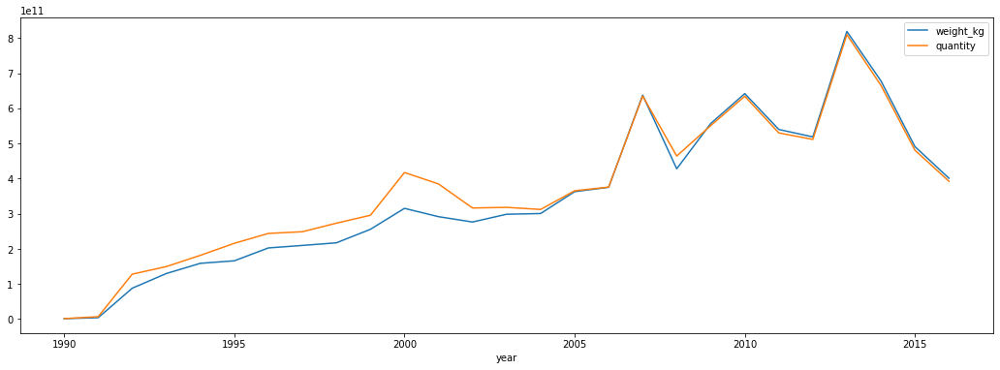

'I can observe an upsurge during the years of 2012 to 2014'

In [25]:
# Observing weight and quantity over the years
df_ie2.plot(figsize=(18,6))

plt.show()

'''I can observe an upsurge during the years of 2012 to 2014'''

# 3 - How does Africa compare to the world in terms of Surplus and Deficit ?

In [26]:
#create dataframe that shows for each year in dataset whether there was a trading surplus or trading deficit, and by how much
exports = commodities_df.loc[commodities_df['flow']=='Export'].groupby('year').sum()['trade_usd']
imports = commodities_df.loc[commodities_df['flow']=='Import'].groupby('year').sum()['trade_usd']
world_current_account = pd.DataFrame()
world_current_account['Exports'] = exports
world_current_account['Imports'] = imports
world_current_account['World Current Account'] = world_current_account['Exports'] - world_current_account['Imports']
world_current_account['Surplus/Deficit'] = ''

for index,row in world_current_account.iterrows():
    if row['World Current Account']>0:
        world_current_account.at[index, 'Surplus/Deficit'] = 'Surplus'
    elif row['World Current Account']<0:
        world_current_account.at[index, 'Surplus/Deficit'] = 'Deficit'

world_current_account

,Exports,Imports,World Current Account,Surplus/Deficit
year,,,,
1988,497667402817,536738881748,-39071478931,Deficit
1989,770490204761,770545606648,-55401887,Deficit
1990,881438533450,925497164548,-44058631098,Deficit
1991,963372899700,984653156219,-21280256519,Deficit
1992,1109162020370,1063193933992,45968086378,Surplus
1993,1208205621409,1172993501583,35212119826,Surplus
1994,1546933707991,1556224658057,-9290950066,Deficit
1995,1963273898368,1939572000186,23701898182,Surplus
1996,2134522627309,2097050865438,37471761871,Surplus


In [27]:
#create dataframe that shows for each year in dataset whether there was a trading surplus or trading deficit, and by how much
exports = african_countries.loc[african_countries['flow']=='Export'].groupby('year').sum()['trade_usd']
imports = african_countries.loc[african_countries['flow']=='Import'].groupby('year').sum()['trade_usd']
africa_current_account = pd.DataFrame()
africa_current_account['Exports'] = exports
africa_current_account['Imports'] = imports
africa_current_account['Africa Current Account'] = africa_current_account['Exports'] - africa_current_account['Imports']
africa_current_account['Surplus/Deficit'] = ''

for index,row in africa_current_account.iterrows():
    if row['Africa Current Account']>0:
        africa_current_account.at[index, 'Surplus/Deficit'] = 'Surplus'
    elif row['Africa Current Account']<0:
        africa_current_account.at[index, 'Surplus/Deficit'] = 'Deficit'

africa_current_account

,Exports,Imports,Africa Current Account,Surplus/Deficit
year,,,,
1990,554167265,404403007,149764258,Surplus
1991,941612697,845200751,96411946,Surplus
1992,12688710554,10384455439,2304255115,Surplus
1993,15493899201,12263240292,3230658909,Surplus
1994,16481744355,18575001537,-2093257182,Deficit
1995,24968149293,32316107764,-7347958471,Deficit
1996,35962644856,29747411297,6215233559,Surplus
1997,39391316331,33608351433,5782964898,Surplus
1998,21602260971,33348179373,-11745918402,Deficit


In [28]:
world_total_surplus_years = world_current_account['Surplus/Deficit'].loc[world_current_account['Surplus/Deficit']=='Surplus'].count()
world_total_deficit_years = world_current_account['Surplus/Deficit'].loc[world_current_account['Surplus/Deficit']=='Deficit'].count()

africa_total_surplus_years = africa_current_account['Surplus/Deficit'].loc[africa_current_account['Surplus/Deficit']=='Surplus'].count()
africa_total_deficit_years = africa_current_account['Surplus/Deficit'].loc[africa_current_account['Surplus/Deficit']=='Deficit'].count()

print(f'World total number of years in period with trade surplus: {world_total_surplus_years}')
print(f'World total number of years in period with trade deficit: {world_total_deficit_years}')

print("\n")
print(f'Africa total number of years in period with trade surplus: {africa_total_surplus_years}')
print(f'Africa total number of years in period with trade deficit: {africa_total_deficit_years}')

World total number of years in period with trade surplus: 4
World total number of years in period with trade deficit: 25


Africa total number of years in period with trade surplus: 20
Africa total number of years in period with trade deficit: 7


From the findings above we realise that while the world started running on deficit from 1997, which stands for 19 years. African nations were not that much affected. 

# 4 - Africa has more Imports or Exports?

In [29]:
cnt_srs = african_countries['flow'].value_counts()

trace = gobj.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color=cnt_srs.values,
        colorscale = 'Picnic'
    ),
)

layout = gobj.Layout(
    title='Imports/Exports Ratio'
)

data = [trace]
fig = gobj.Figure(data=data, layout=layout)
offline.iplot(fig, filename="Ratio")

# # 5 - Which country has the most Exports overall?

In [30]:
ex = african_countries[african_countries['flow']=='Export']

top_Export = ex.drop(columns=['comm_code','commodity']).groupby(by='country_or_area').agg({'quantity':sum})

g = top_Export['quantity'].nlargest(10)

next = [Bar(
            y=g,
            x=g.keys(),
            marker = dict(
            color = 'rgba(209, 27, 167, 0.9)')
    )]
layout1 = gobj.Layout(
    title="Top 10 Exporters",
    xaxis=dict(
        title='Country',
        titlefont=dict(
            family='Courier New, monospace',
            size=30,
            color='#7f7f7f'
               )
    ),
    yaxis=dict(
        title='Total Amount of Quantity',
        titlefont=dict(
            family='Courier New, monospace',
            size=22,
            color='#7f7f7f'
        )
    )
)
myFigure2 = gobj.Figure(data = next, layout = layout1)
iplot(myFigure2)

'''Algeria followed by South Africa'''

'Algeria followed by South Africa'

# # 6 - Which country has the most Imports overall?

In [31]:
ex = african_countries[african_countries['flow']=='Import']

top_Export = ex.drop(columns=['comm_code','commodity']).groupby(by='country_or_area').agg({'quantity':sum})

g = top_Export['quantity'].nlargest(10)

next = [Bar(
            y=g,
            x=g.keys(),
            marker = dict(
            color = 'rgba(227, 155, 66, 0.9)')
    )]
layout1 = gobj.Layout(
    title="Top 10 Importers",
    xaxis=dict(
        title='Country',
        titlefont=dict(
            family='Courier New, monospace',
            size=30,
            color='#7f7f7f'
               )
    ),
    yaxis=dict(
        title='Total Amount of Quantity',
        titlefont=dict(
            family='Courier New, monospace',
            size=22,
            color='#7f7f7f'
        )
    )
)
myFigure2 = gobj.Figure(data = next, layout = layout1)
iplot(myFigure2)

'''Interesting to see that Egypt is on top and Algeria is the next up, followed by Botswana'''

'Interesting to see that Egypt is on top and Algeria is the next up, followed by Botswana'

## 7 - Which year had the highest import and export? 

In [32]:
tradeImport = african_countries[(african_countries.flow == 'Import')].groupby(['year'],as_index=False)['trade_usd'].agg('sum')
tradeExport = african_countries[(african_countries.flow == 'Export')].groupby(['year'],as_index=False)['trade_usd'].agg('sum')

trace1 = gobj.Bar(
                x = tradeImport.year,
                y = tradeImport.trade_usd,
                name = "Africa Import",
                marker = dict(color = 'rgba(66, 227, 117, 0.8)'),
)

trace2 = gobj.Bar(
               x = tradeExport.year,
                y = tradeExport.trade_usd,
                name = "Africa Export",
                marker = dict(color = 'rgba(245, 66, 72, 0.8)'),
)
data = [trace1, trace2]
layout = {
    'xaxis': {'title': 'Year 1990-2016'},
    'yaxis': {'title': 'Trade of Import & Export in Africa (USD)'},
    'barmode': 'group',
    'title': 'Import and Export in Africa'
}
fig = gobj.Figure(data = data, layout = layout)
iplot(fig)

''' From the graph we can see that 2011 had the highest Export and 2014 had the highest Import'''

' From the graph we can see that 2011 had the highest Export and 2014 had the highest Import'

# 8 - How do African countries rank by trade?

In [33]:
df_country=african_countries.groupby(['country_or_area'],as_index=True)[['weight_kg','quantity']].agg('sum')

In [34]:
df_country=african_countries.sort_values(['weight_kg'],ascending=False)

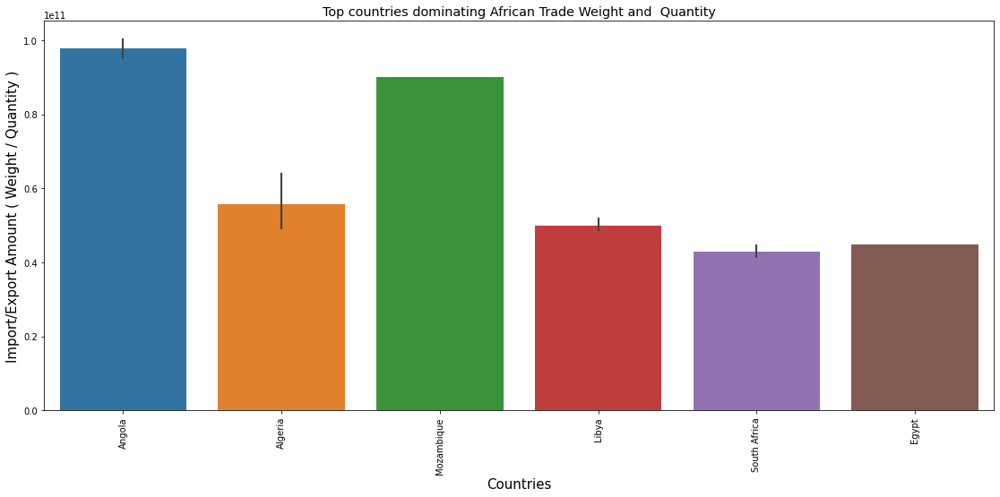

'Angola is the dominant country'

In [35]:
fig, ax = plt.subplots()

fig.set_size_inches(19, 8)

sns.set_context("paper", font_scale=1.5)
f=sns.barplot(x=df_country["country_or_area"].head(30), y=df_country['weight_kg'].head(30), data=df_country)
f.set_xlabel("Countries",fontsize=15)
f.set_ylabel("Import/Export Amount ( Weight / Quantity )",fontsize=15)
f.set_title('Top countries dominating African Trade Weight and  Quantity')
for item in f.get_xticklabels():
    item.set_rotation(90)
    
plt.show()
    
'''Angola is the dominant country'''

In [36]:
top_quantity = african_countries.drop(columns=['comm_code','commodity']).groupby(by='country_or_area').agg({'quantity':sum})

In [37]:
x = top_quantity['quantity'].nlargest(10)

In [38]:
let = [Bar(
            y=x,
            x=x.keys(),
            marker = dict(
            color = 'rgba(66, 224, 245, 0.9)'
            ),
            name = "Contractor's amount earned per project"
    )]
layout1 = gobj.Layout(
    title="Top 10 Quantity",
    xaxis=dict(
        title='Country',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
               )
    ),
    yaxis=dict(
        title='Total Amount of Quantity',
        titlefont=dict(
            family='Courier New, monospace',
            size=18,
            color='#7f7f7f'
        )
    )
)
myFigure2 = gobj.Figure(data = let, layout = layout1)
iplot(myFigure2)



'''When it comes down to quantity alone Algeria takes the top spot'''

'When it comes down to quantity alone Algeria takes the top spot'

In [39]:
top15_trade_count=list(african_countries.country_or_area.value_counts().index)
df_top15_trade_count = african_countries[african_countries['country_or_area'].isin(top15_trade_count)]

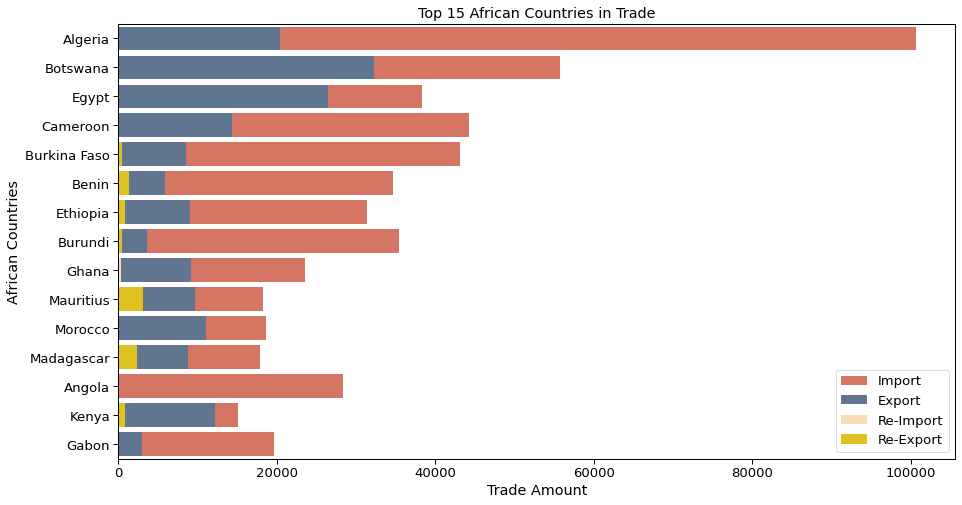

'Top 15 African Countries in Trade'

In [40]:
# This is the trade amount of each country
fig,ax = plt.subplots(figsize=(15,8))
sns.countplot(y='country_or_area',
           data=df_top15_trade_count[df_top15_trade_count['flow']=='Import'],
             color='#E86850',
             order = african_countries.country_or_area.value_counts().head(15).index,
             label="Import",)
sns.countplot(y='country_or_area',
           data=df_top15_trade_count[df_top15_trade_count['flow']=='Export'],
             color='#587498',
             order = african_countries.country_or_area.value_counts().head(15).index,
             label="Export")
sns.countplot(y='country_or_area',
           data=df_top15_trade_count[df_top15_trade_count['flow']=='Re-Import'],
             color='#FFDEAD',
             order = african_countries.country_or_area.value_counts().head(15).index,
             label="Re-Import")
sns.countplot(y='country_or_area',
           data=df_top15_trade_count[df_top15_trade_count['flow']=='Re-Export'],
             color='#FFD800',
             order = african_countries.country_or_area.value_counts().head(15).index,
             label="Re-Export")
ax.legend(loc="lower right", frameon=True)
ax.set(title ="Top 15 African Countries in Trade",
    ylabel="African Countries",
       xlabel="Trade Amount")
ax.grid(which='minor',alpha=5)
plt.show()


'''Top 15 African Countries in Trade'''

In [41]:
df_countries_trade = african_countries.groupby(['country_or_area','flow'],as_index=False)['trade_usd'].agg('sum')

top15_countries = african_countries.groupby(['country_or_area'],as_index=False)['trade_usd'].agg('sum')
top15_countries = top15_countries.sort_values(['trade_usd'],ascending=False)[15:0:-1]

df_countries_trade = df_countries_trade[df_countries_trade['country_or_area'].isin(top15_countries['country_or_area'])]
df_countries_trade=df_countries_trade.pivot('country_or_area','flow','trade_usd')
df_countries_trade=df_countries_trade.reindex(top15_countries['country_or_area'])

# Draw the stacked bar plot of the most 10 traded countries

traces=[]
colors=['rgba(50, 171, 96, 1.0)']
for flow in list(df_countries_trade):
    traces.append(gobj.Bar(
        y=df_countries_trade.index,
        x=df_countries_trade[flow],
        name=flow,
        orientation='h',
        opacity=0.8,
    ))

data = traces
layout = gobj.Layout(
    title='Top 15 Trade Volume Countries in Africa',
    margin=gobj.layout.Margin(
        l=100,
        r=50,
        b=100,
        t=100,
        pad=1
        ),
    barmode='stack',
    
)

fig = gobj.Figure(data=data, layout=layout)
iplot(fig,filename='stack_barplot')

'''Top 15 Trade Volume Countries in Africa'''

'Top 15 Trade Volume Countries in Africa'

# 9 - Which are the top Import/Export of Commodities and Categories in Africa?

In [42]:
temp = african_countries[(african_countries.year == 2010)
       & (african_countries.flow=='Import')
       & (african_countries.commodity != 'ALL COMMODITIES')].sort_values(by="trade_usd",  ascending=False).iloc[1:16, :]
trade_2000import = temp.sort_values(by="trade_usd",  ascending=True)
trace1 = gobj.Bar(
                x = trade_2000import.trade_usd,
                y = trade_2000import.commodity,
                marker = dict(color = 'rgba(206, 66, 245, 0.8)'),
                orientation = 'h')

data = [trace1]
layout = {
#     'xaxis': {'title': 'Trade in USD'},
    'yaxis': {'automargin':True,},
    'title': "Top 10 Commodities in Africa Import Trade (USD) 2010"
}
fig = gobj.Figure(data = data, layout = layout)
iplot(fig)



In [43]:
temp = african_countries[(african_countries.year == 2010)
       & (african_countries.flow=='Export')
       & (african_countries.commodity != 'ALL COMMODITIES')].sort_values(by="trade_usd",  ascending=False).iloc[1:16, :]
trade_2000import = temp.sort_values(by="trade_usd",  ascending=True)
trace1 = gobj.Bar(
                x = trade_2000import.trade_usd,
                y = trade_2000import.commodity,
                marker = dict(color = 'rgba(206, 66, 245, 0.8)'),
                orientation = 'h')

data = [trace1]
layout = {
#     'xaxis': {'title': 'Trade in USD'},
    'yaxis': {'automargin':True,},
    'title': "Top 10 Commodities in Africa Export Trade (USD) 2010"
}
fig = gobj.Figure(data = data, layout = layout)
iplot(fig)


In [44]:

temp1 = african_countries[(african_countries.year == 2010) & (african_countries.flow=='Import')
        & (african_countries.commodity != 'ALL COMMODITIES')].sort_values(by="trade_usd",  ascending=False)
trade_2015import = temp1.sort_values(by="trade_usd",  ascending=True)
trace1 = gobj.Bar(
                x = trade_2015import.trade_usd,
                y = trade_2015import.category.tolist(),
                marker = dict(color = 'rgba(249, 205, 190, 0.8)'),
                orientation = 'h')

data = [trace1]
layout = {
#  'xaxis': {'title': 'Trade in USD'},
    'yaxis': {'automargin':True,},
    'title': "Top 10 Categoties in Africa Import Trade (USD) 2010"
}
fig = gobj.Figure(data = data, layout = layout)
iplot(fig)

In [45]:

temp1 = african_countries[(african_countries.year >= 2010) & (african_countries.flow=='Export')
        & (african_countries.commodity != 'ALL COMMODITIES')].sort_values(by="trade_usd",  ascending=False)
trade_2015import = temp1.sort_values(by="trade_usd",  ascending=True)
trace1 = gobj.Bar(
                x = trade_2015import.trade_usd,
                y = trade_2015import.category.tolist(),
                marker = dict(color = 'rgba(249, 205, 190, 0.8)'),
                orientation = 'h')

data = [trace1]
layout = {
#  'xaxis': {'title': 'Trade in USD'},
    'yaxis': {'automargin':True,},
    'title': "Top 10 Categoties in Africa Import Trade (USD) 2010"
}
fig = gobj.Figure(data = data, layout = layout)
iplot(fig)

Pretroleum Oils is the biggest commodity getting imported and export on the continent. 

Mineral fuels oil is the biggest category getting imported and export on the continent.

# 10 - How do categories and commodities rank in price in the continent?

In [46]:
df_category = african_countries[(african_countries.commodity != 'ALL COMMODITIES')].groupby(['commodity'],as_index=False)['trade_usd'].agg('sum').sort_values(['trade_usd'],ascending=False)
df_category = df_category[10:0:-1]
df_category['commodity'] = df_category['commodity']

african_countries[(african_countries.year >= 2010) & (african_countries.flow=='Export')
        & (african_countries.commodity != 'ALL COMMODITIES')]

# This is the trade volume of each category
Data = [gobj.Bar(
            x=df_category['trade_usd'],
            y=df_category['commodity'],
            marker=dict(
                color='rgb(149, 245, 66)',
                line=dict(
                    color='rgb(8,48,107)',
                    width=1.5),
            ),
            opacity=0.6,
            orientation='h',
        )]


Layout = gobj.Layout(
    title='Trade Amount ($) of Top 10 Commodities',
    margin=gobj.layout.Margin(
        l=300,
        r=50,
        b=100,
        t=100,
        pad=1
        ),
    xaxis=dict(
        title='Trade Amount',
    )
    
    )

fig = gobj.Figure(data=Data, layout=Layout)
offline.iplot(fig)

In [47]:
df_category = african_countries[(african_countries.commodity != 'ALL COMMODITIES')].groupby(['category'],as_index=False)['trade_usd'].agg('sum').sort_values(['trade_usd'],ascending=False)
df_category = df_category[10:0:-1]
df_category['category'] = df_category['category'].str.replace('_',' ').str.extract(r'\d{1,2}\s?(.*)',expand=True)

# This is the trade volume of each category
Data = [gobj.Bar(
            x=df_category['trade_usd'],
            y=df_category['category'].str.capitalize(),
            marker=dict(
                color='rgb(149, 245, 66)',
                line=dict(
                    color='rgb(8,48,107)',
                    width=1.5),
            ),
            opacity=0.6,
            orientation='h',
        )]


Layout = gobj.Layout(
    title='Trade Amount ($) of Top 10 Categories',
    margin=gobj.layout.Margin(
        l=300,
        r=50,
        b=100,
        t=100,
        pad=1
        ),
    xaxis=dict(
        title='Trade Amount',
    )
    
    )

fig = gobj.Figure(data=Data, layout=Layout)
offline.iplot(fig)

In [48]:
def check_outlier(arr):
    return arr.quantile(0.99)

In [49]:
df_petroleum = df_top15_trade_count[(df_top15_trade_count['commodity'].str.contains('petroleum',case=False))][['country_or_area','year','quantity']]
petro_groupby = df_petroleum.groupby(['country_or_area','year'])

petroleum_merge = pd.merge(df_petroleum, petro_groupby.transform(check_outlier), left_index=True,right_index = True,suffixes=['_value','_quantile'])
df_petroleum = petroleum_merge[petroleum_merge['quantity_value'] < petroleum_merge['quantity_quantile']]
df_petroleum = df_petroleum.drop(labels='quantity_quantile',axis=1).rename(columns={"quantity_value":"quantity"})

df_petroleum = df_petroleum.groupby(['country_or_area','year'],as_index=False)['quantity'].agg('sum').fillna(0)
df_petroleum_sum = df_petroleum.groupby(['country_or_area'],as_index=False)['quantity'].agg('sum')
df_petroleum_sum = df_petroleum_sum.sort_values(['quantity'],ascending=False)
df_petroleum_sum = df_petroleum_sum[1:11]

# Draw the line of serveral countries
# Create a trace, which is a Data object

traces=[]
for i in df_petroleum_sum['country_or_area']:
    traces.append(gobj.Scatter(
        x=df_petroleum[df_petroleum['country_or_area'] == i].year,
        y=df_petroleum[df_petroleum['country_or_area'] == i].quantity,
        mode='lines+markers',
        name=i,
    )
    )
    
# Create a Layout object
layout = gobj.Layout(
    title= 'Top 10 Countries trading Petroleum in the continent',
    xaxis=dict(
        title="Year",
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        dtick=False,
        ticks='outside',
        tickcolor='rgb(204, 204, 204)',
        tickwidth=2,
        ticklen=5,
        #tickangle=270,
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(120, 120, 120)',
        ),
    ),
    yaxis=dict(
        
        title="Petroleum Quantity",
        showgrid=True,
        zeroline=False,
        showline=False,
        showticklabels=True,
       
        
    ),
    #autosize=True,
    
    showlegend=True,
)


fig = gobj.Figure(data=traces, layout=layout)

offline.iplot(fig)



# 11 - Which is the most exported commodity of each country?

In [50]:
products = african_countries[(african_countries['flow']=='Export') & (african_countries['year'] > 1989)].groupby(['country_or_area', 'commodity'])['trade_usd'].sum().reset_index()
plot_df = products[~products['commodity'].isin(['ALL COMMODITIES', 'Commodities not specified according to kind'])].sort_values(['country_or_area', 'trade_usd'], ascending=False).groupby('country_or_area').first().reset_index()

scl = [[0.0, '#ff0000'],[1.0, '#00ff00']]

# Data for the map
data = [dict(type='choropleth',
             colorscale = scl,
             autocolorscale = False,
             locations = plot_df['country_or_area'],
             z = plot_df['trade_usd'],
             text = plot_df['commodity'],
             locationmode = 'country names',
             marker = dict(line = dict (color = '#000000',
                                        width = 1)),
             colorbar = dict(title = 'Export in USD'))]

# Layout for the map
layout = dict(title = 'Export of the most valuable commodity')
    
fig = dict(data=data, layout=layout)
iplot(fig)

# 12 - Which is the most imported commodity of each country?

In [51]:
products = african_countries[(african_countries['flow']=='Import') & (african_countries['year'] > 1989)].groupby(['country_or_area', 'commodity'])['trade_usd'].sum().reset_index()
plot_df = products[~products['commodity'].isin(['ALL COMMODITIES', 'Commodities not specified according to kind'])].sort_values(['country_or_area', 'trade_usd'], ascending=False).groupby('country_or_area').first().reset_index()

scl = [[0.0, '#ff0000'],[1.0, '#00ff00']]

# Data for the map
data = [dict(type='choropleth',
             colorscale = scl,
             autocolorscale = False,
             locations = plot_df['country_or_area'],
             z = plot_df['trade_usd'],
             text = plot_df['commodity'],
             locationmode = 'country names',
             marker = dict(line = dict (color = '#000000',
                                        width = 1)),
             colorbar = dict(title = 'Export in USD'))]

# Layout for the map
layout = dict(title = 'Import of the most valuable commodity')
    
fig = dict(data=data, layout=layout)
iplot(fig)

# Conclusion

## From my EDA, I conclude the following:


### 1 - How African countries perform compared to the rest of the world?

It's unfortunate to see that the continent perform quote poorly in relation to the rest of the world.

From the above representations it only amounts to about 5% of the worlds trade.


### 2 - When did the largest and heaviest trades take place?

'I can observe an upsurge during the years of 2012 to 2014'


### 3 - How does Africa compare to the world in terms of Surplus and Deficit ?

It's impressive to see that in that area Africa performs better than the rest of the world.

From the findings above we realise that while the world started running on deficit from 1997 to 2016, which stands for 19 years. African nations were not that much affected. 


### 4 - Africa has more Imports or Exports?

There are more imports, and with a pretty high margin at it.


### 5 - Which country has the most Exports overall?


Algeria followed by South Africa


### 6 - Which country has the most Imports overall?

Interesting to see that Egypt is on top and Algeria is the next up, followed by Botswana


### 7 - Which year had the highest import and export?

From the graph we can see that 2011 had the highest Export and 2014 had the highest Import


### 8 - How do African countires rank by trade?

Angola is the dominating country when it comes to weight and quantity.

When it comes to amount of trades Algeria takes the top spot as well as quantity of goods traded

Egypt competes with Angola on volume of trade but Egypt has the upper hand


### 9 - Which are the top Import/Export of Commodities and Categories in Africa?

Pretroleum Oils is the biggest commodity getting imported and export on the continent. 

Mineral fuels oil is the biggest category getting imported and export on the continent.


### 10 - How do categories and commodities rank in price in the continent?

Pretroleum Oils generate the highest amounts

Egypt, Angola and Lybia are the top trades in the continent. Lybia seems to have a sharp drop in trades in the later years, I take it that those are results caused by the wars taking place in the county.


### 11 - Which is the most exported commodity of each country?

Pretroleum Oils are the commodities most exported by Algeria and Angola, which also stand out as the highest commodities in the continent


### 12 - Which is the most imported commodity of each country?

Pretroleum Oils, out of all the countries Egypt imports the most as we seen previously as well


### Final Observations:

Although the continent amounts to about 5% of the world's trades, overall it has potential to increse to growth, while still being one of the biggest Pretroleum Oils traders.

From my observation 3 countries dominate the trades in the continent:

    - Algeria
    - Angola
    - Egypt